Pada tutorial praktikum bertujuan bagaimana membuat model dengan metode depp learning, Convulution neural network (CNN) yang dapat digunkan untuk melakukan klasifikasi gambar.

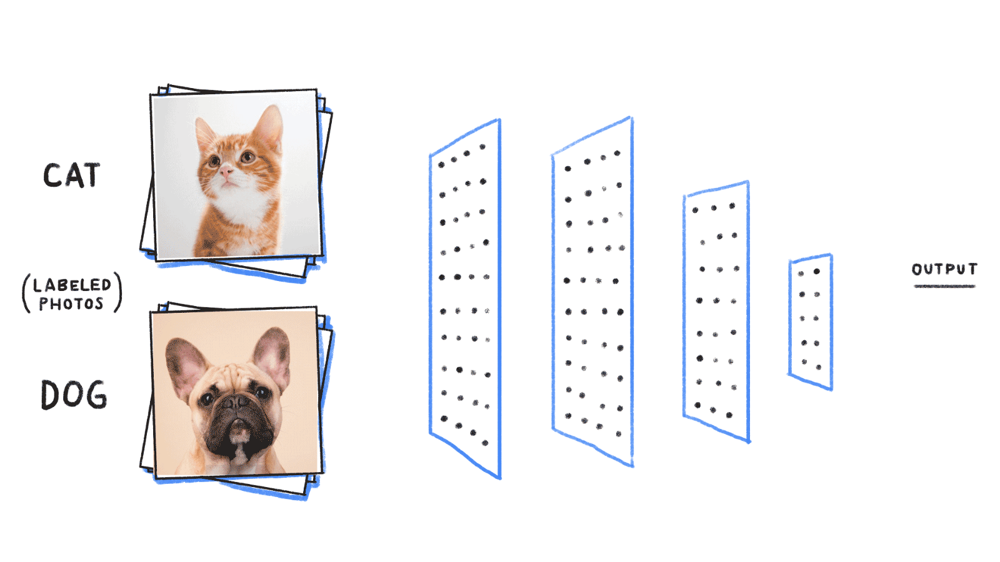

# kebutuhan : melakukan instalasi library tensorflow dan Keras
- conda install -c conda-forge tensorflow
- conda install -c conda-forge/label/broken tensorflow
- conda install -c conda-forge/label/cf201901 tensorflow
==============================================================
- pip install tensorflow keras numpy skimage matplotlib
==============================================================
- conda install -c conda-forge keras
- conda install -c conda-forge/label/broken keras
- conda install -c conda-forge/label/cf201901 keras

menggunakan datasample yang terdapat didalam library, selanjunya data dibagi menjadi:
variabel x_train (variabel yang berisi data latih).
variabel y_train (variabel yang berisi label gambar di data latih).
variabel x_test (variabel berisi data uji)
variabel y_test (variabel berisi label gambar di data uji)


In [16]:
#Load the data
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

/home/cak/anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


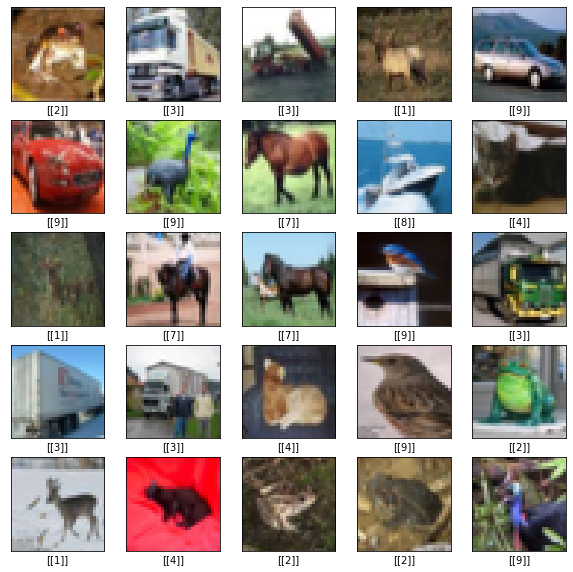

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i], cmap=plt.cm.binary)
    plt.xlabel(y_train[y_train[i]])

# Eksplorasi data
menampilkan kumpulan data yang terdapat dalam library. ini bertujuan untuk memberi tahu jenis data yang ada didalamnya

In [18]:
print(type(x_train))
print(type(y_train))
print(type(x_test))
print(type(y_test))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


mendapatkan keterangan gambar pada. 

x_train,
adalah array 4-Dimensi dengan 50.000 baris gambar 32 x 32 piksel dengan kedalaman = 3 (RGB) di mana R adalah Merah, G adalah Hijau, dan B adalah Biru.

y_train, 
adalah array 2 Dimensi dengan 50.000 baris dan 1 kolom.

x_test, 
Bentuk set data x_test adalah array 4-Dimensi dengan 10.000 baris gambar 32 x 32 piksel dengan kedalaman = 3 (RGB).

y_test.
Bentuk data y_test adalah array 2 Dimensi dengan 10.000 baris dan 1 kolom.

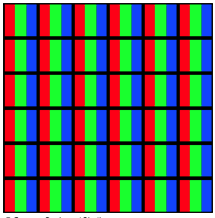

In [19]:
print('x_train shape:', x_train.shape)
print('y_train shape:', y_train.shape)
print('x_test shape:', x_test.shape)
print('y_test shape:', y_test.shape)

x_train shape: (50000, 32, 32, 3)
y_train shape: (50000, 1)
x_test shape: (10000, 32, 32, 3)
y_test shape: (10000, 1)


menguji coba, ekstraksi gambar yang terdapat pada index pertama = 0 

In [20]:
x_train[6]

array([[[164, 206,  84],
        [105, 140,  61],
        [118, 148, 101],
        ...,
        [109, 147,  73],
        [108, 147,  69],
        [ 91, 129,  57]],

       [[167, 213,  84],
        [116, 160,  49],
        [ 72, 109,  43],
        ...,
        [105, 142,  79],
        [105, 142,  72],
        [ 89, 127,  57]],

       [[140, 191,  65],
        [142, 193,  66],
        [119, 163,  79],
        ...,
        [104, 139,  84],
        [ 84, 120,  58],
        [ 78, 115,  49]],

       ...,

       [[139, 148,  81],
        [142, 155,  74],
        [135, 156,  72],
        ...,
        [ 89, 134,  28],
        [ 97, 148,  24],
        [126, 176,  49]],

       [[163, 157,  85],
        [153, 164,  82],
        [146, 164,  90],
        ...,
        [ 85, 130,  19],
        [ 98, 148,  27],
        [127, 178,  48]],

       [[183, 153, 102],
        [176, 182, 116],
        [154, 154, 100],
        ...,
        [ 94, 134,  29],
        [ 91, 133,  26],
        [122, 170,  44]]

bentuk gambarnya

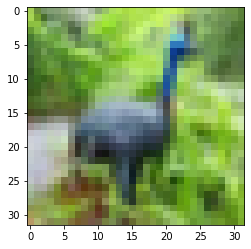

In [21]:
import matplotlib.pyplot as plt
img = plt.imshow(x_train[6])

melihat label gambar 

In [22]:
print('The label is:', y_train[0])

The label is: [6]


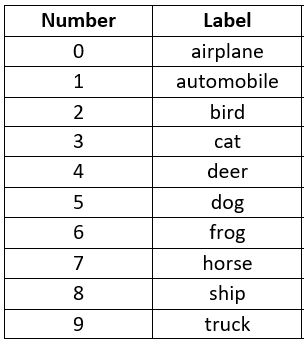

Gunakan teknik one-hot encoding, untuk mengubah label menjadi 10 angka untuk dimasukan kedalam jaringan saraf tiruan. meyesuaikan dengan jumlah label yang mengklasifikasi gambar.

In [23]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

In [24]:
print(y_train_one_hot)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


tampilkan contoh label baru menggunakan gambar pertama dalam data latih.

In [25]:
print('The one hot label is:', y_train_one_hot[0])

The one hot label is: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]


Normalisasi pixel gambar menjadi nilai antara 0 dan 1, menjadi angka diantara 0 sampai dengan  255, membatu dalam jaringan saraf.

In [26]:
x_train = x_train / 255
x_test = x_test / 255

Membangun Model Jaringan Saraf Konvolusi

Untuk membangun model kita perlu membuat arsitektur menggunakan Sequential ().



In [27]:
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
model = Sequential()

Selanjutnya kita tambahkan layer pertama, layer konvolusi untuk mengekstraksi fitur dari gambar input, dan membuatnya menjadi 32 5 x 5. Lapisan pertama, kita harus memasukkan bentuk dimensi yang merupakan gambar 32 x 32 piksel dengan kedalaman = 3 (RGB)

In [28]:
model.add(Conv2D(32, (5, 5), activation='relu', input_shape=(32,32,3)))

Buat satu lagi lapisan konvolusi dan lapisan gabungan seperti sebelumnya, tetapi tanpa input_shape.

In [29]:
model.add(Conv2D(64, (5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

Tambahkan lapisan rata, untuk mengurangi gambar menjadi array linier yang juga dikenal sebagai vektor 1-Dimensi untuk dimasukkan ke dalam dan terhubung dengan jaringan saraf.

In [30]:
model.add(Flatten())

Sekarang buat jaringan saraf di mana lapisan pertama memiliki 1000 neuron dan fungsi aktivasi ReLu.

In [31]:
model.add(Dense(1000, activation='relu'))

Buat lapisan terakhir dari jaringan saraf ini dengan 10 neuron (satu untuk setiap label) menggunakan fungsi softmax.

In [32]:
model.add(Dense(10, activation='softmax'))

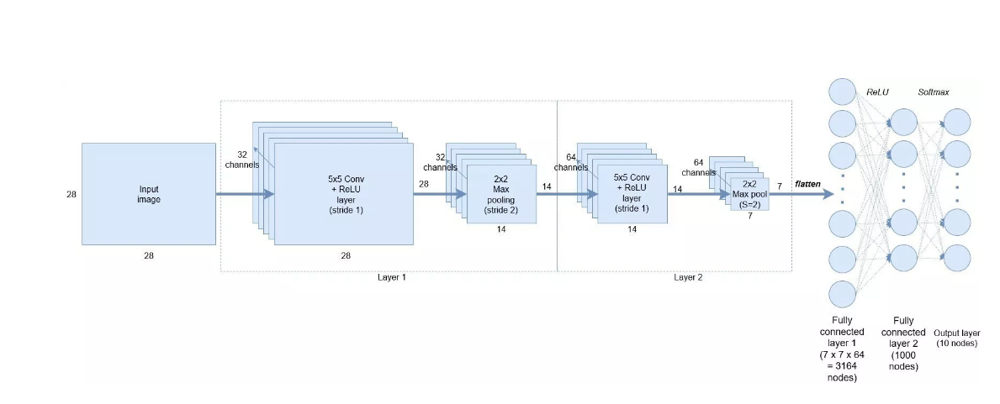

Kompilasi model. Berikan fungsi loss kategori_crossentropy yang digunakan untuk kelas lebih besar dari 2, optimal dan keakuratan model.

In [33]:
model.compile(loss='categorical_crossentropy', 
              optimizer='adam',
              metrics=['accuracy'])

In [35]:
hist = model.fit(x_train, y_train_one_hot, batch_size=256, epochs=3, validation_split=0.3 )

Train on 35000 samples, validate on 15000 samples
Epoch 1/3
35000/35000 [==============================] - 158s 5ms/step - loss: 1.5036 - accuracy: 0.4570 - val_loss: 1.4091 - val_accuracy: 0.4885
Epoch 2/3
35000/35000 [==============================] - 161s 5ms/step - loss: 1.2683 - accuracy: 0.5489 - val_loss: 1.2844 - val_accuracy: 0.5483
Epoch 3/3
35000/35000 [==============================] - 157s 4ms/step - loss: 1.1061 - accuracy: 0.6117 - val_loss: 1.1630 - val_accuracy: 0.5909


In [36]:
model.evaluate(x_test, y_test_one_hot)[1]

10000/10000 [==============================] - 21s 2ms/step


0.5953999757766724

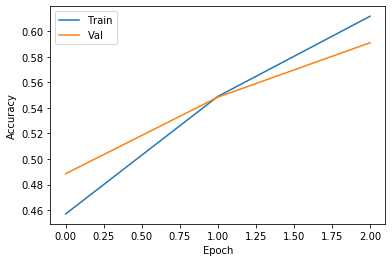

In [39]:
#Visualize the models accuracy
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

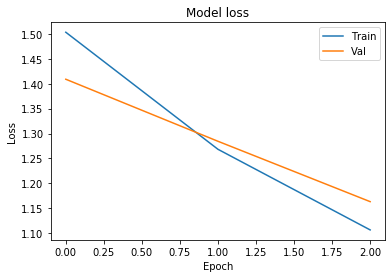

In [40]:
#Visualize the models loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

# masukkan gambar untuk di prediksi

In [86]:
my_image = plt.imread("kuda2.jpeg")

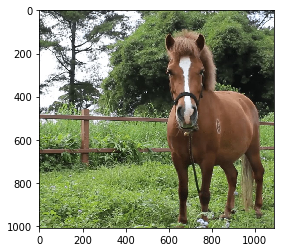

In [87]:
img = plt.imshow(my_image)

In [88]:
from skimage.transform import resize

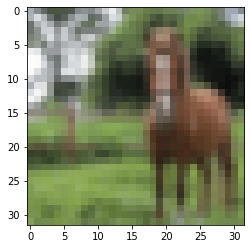

In [89]:
my_image_resize = resize(my_image,(32,32,3))
img = plt.imshow(my_image_resize)

In [90]:
import numpy as np
probabilities = model.predict(np.array([my_image_resize]))

In [91]:
probabilities

array([[3.38435150e-03, 2.77888821e-03, 2.96978187e-02, 2.90067736e-02,
        2.89289951e-01, 4.99791205e-02, 6.83725951e-03, 5.86720288e-01,
        1.06169304e-04, 2.19936809e-03]], dtype=float32)

In [92]:
number_to_class=['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

In [93]:
index = np.argsort(probabilities[0,:])

# Tampilkan Hasil prediksi

In [96]:
print("Most likely class:", number_to_class[index[9]], "-- Probability:", probabilities[0,index[9]])
print("Second most likely class:", number_to_class[index[8]], "-- Probability:", probabilities[0,index[8]])
print("Third most likely class:", number_to_class[index[7]], "-- Probability:", probabilities[0,index[7]])
print("Fourth most likely class:", number_to_class[index[6]], "-- Probability:", probabilities[0,index[6]])
print("Fifth most likely class:", number_to_class[index[5]], "-- Probability:", probabilities[0,index[5]])

Most likely class: horse -- Probability: 0.5867203
Second most likely class: deer -- Probability: 0.28928995
Third most likely class: dog -- Probability: 0.04997912
Fourth most likely class: bird -- Probability: 0.029697819
Fifth most likely class: cat -- Probability: 0.029006774


In [97]:
model.save('my_model.h5')

In [98]:
from keras.models import load_model
model = load_model('my_model.h5')